In [10]:
%%bash
pip install jupyter_contrib_nbextensions
pip install RISE
pip install geemap
pip install eemont
pip install autopep8
pip install rasterio
pip install numpy

  Using cached eemont-0.3.4-py3-none-any.whl
  Using cached geopy-2.2.0-py3-none-any.whl (118 kB)
  Using cached geographiclib-1.52-py3-none-any.whl (38 kB)


[How to generate a slideshow from a notebook](https://towardsdatascience.com/5-slides-for-tips-on-presentation-mode-in-jupyter-notebook-f858b15fff4f#:~:text=The%20first%20step%20is%20to,Slideshow%20option%20and%20continue%20reading.&text=Each%20cell%20in%20the%20Jupyter,in%20the%20upper%2Dright%20corner.)

# Google Earth Engine to Rasterio
<div style="display: flex; justify-content: space-around; align-items: center;">
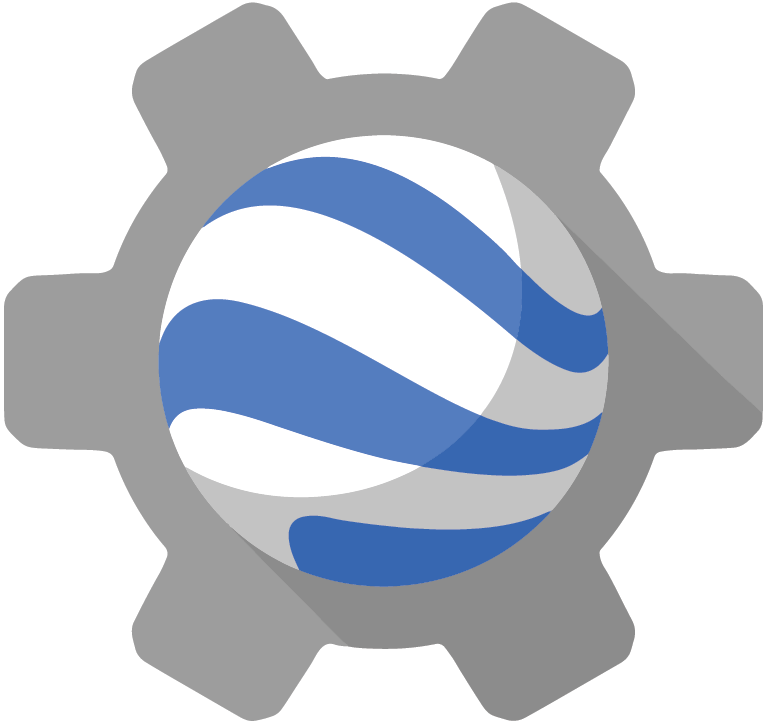
<span style="font-size: 50vh;">➡</span>
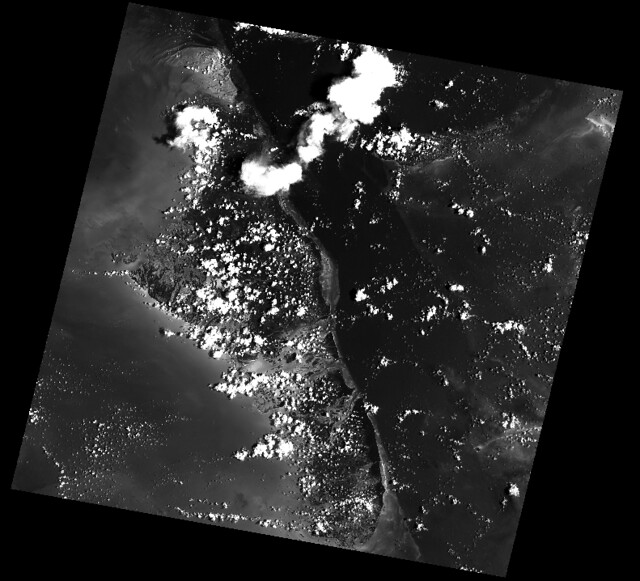
</div>


## Google Earth Engine
Google earth engine combines a multi-petabyte catalog of satellite imagery and geospatial datasets with planetary-scale analysis capabilities

In [7]:
import ee, eemont, geemap
# Authenticate and Initialize Earth Engine and geemap.
# ee.Authenticate()
ee.Initialize()
Map = geemap.Map()

In [8]:
# Example point of interest to filter the image collection.
point = ee.Geometry.Point([-75.92, 2.86])
# Get and filter the Sentinel-2 Surface Reflectance image collection and filter it by region and time.
S2 = (ee.ImageCollection('COPERNICUS/S2_SR')
      .filterDate('2020-01-01','2021-01-01').filterBounds(point))
# Cloud Probability masking is the default method to mask clouds and shadows in Sentinel-2 (method = 'cloud_prob'). By default, the Cloud Probability threshold is 60% (prob = 60).
S2c = S2.maskClouds()

In [9]:
# Visualization
# Set the visualization parameters.
rgbUnscaled = {'min':0, 'max':3000, 'bands':['B4','B3','B2']}
# Use geemap to display results.
Map.centerObject(point,15)
Map.addLayer(S2c.median(),rgbUnscaled,'60% Cloud Probability masking')
Map

Map(center=[2.86, -75.92], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childre…

In case of bad internet / viewing in a repo - here is what the map looks like
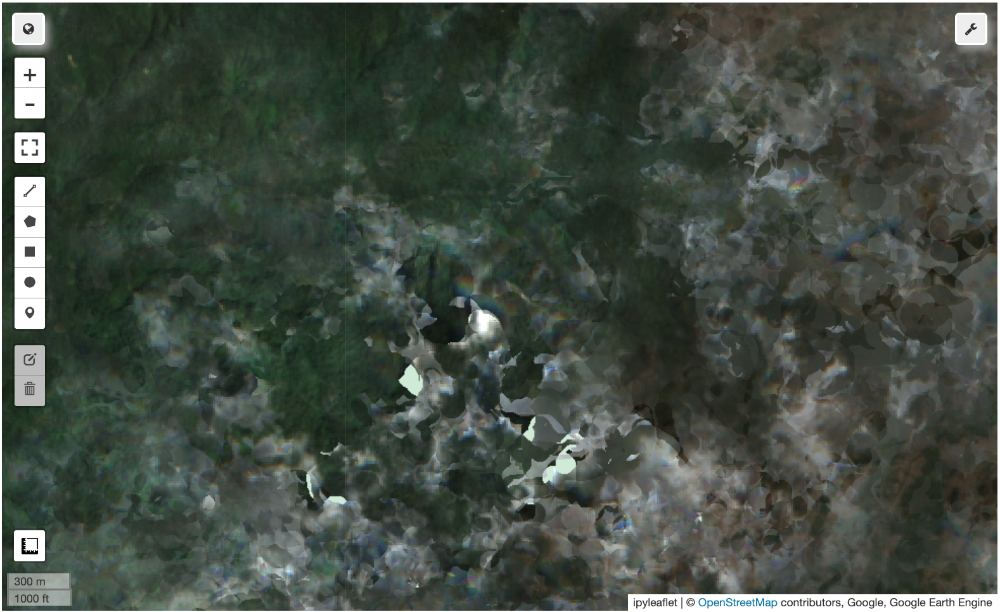

## Rasterio
Rasterio reads and writes geospatial raster data.

Geographic information systems use GeoTIFF and other formats to organize and store gridded, or raster, datasets. Rasterio reads and writes these formats and provides a Python API based on N-D arrays.

In [ ]:
import rasterio
from rasterio.plot import show

with rasterio.open("https://oin-hotosm.s3.amazonaws.com/56f9b5a963ebf4bc00074e70/0/56f9c2d42b67227a79b4faec.tif") as src:
    show(src)
    

In case of bad internet / viewing in a repo, here is what the output looks like:
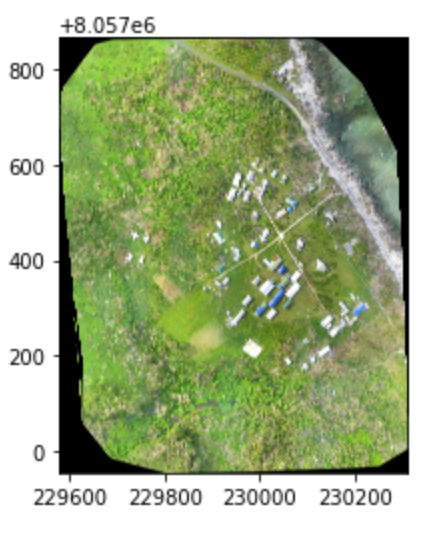

## High Level - Remote Sensing Pipeline
I'll start from giving the hight level data flow and then demonstrate in code - with the goal of providing an easy starting point to fill the "pipeline" with steps relevant to individual projects.

We'll focus on Python APIs as they allow us to work with one programming language accross the pipeline, though Google Earth Engine has a language agnostic (REST) API, and an online coding environment using JavaScript (albeit with a slightly limited syntax) as it's coding language, accessible via [code.earthengine.google.com](https://code.earthengine.google.com/).

If you come accross useful code written in JavaScript, conversion isn't too hard if you know both languages' syntax (main challenges are anonymous functions and dictionary parameters changing into keyword parameters in Python). Google provides some support for converting code from JavaScript to Python, demonstrated [in this notebook](https://github.com/giswqs/geemap/blob/master/examples/notebooks/15_convert_js_to_py.ipynb).

### 1. Get input data

Google Earth Engine data catalog: https://developers.google.com/earth-engine/datasets

**Note: Some data can be accessed using other providers / using other services, some is unique**

#### Satellite Data
  - Sentinel (1, 2, 3) - 2 is used for current 10m res RGB, 1 for 10m res infrared
  - Landsat (4, 5, 7. 8. 9) - 8 is widely used for historical data at 30m res
  - High-Resolution Imagery
  - Others satellites: MODIS, ALOS

<div style="display: flex; justify-content: space-around; align-items: center;">
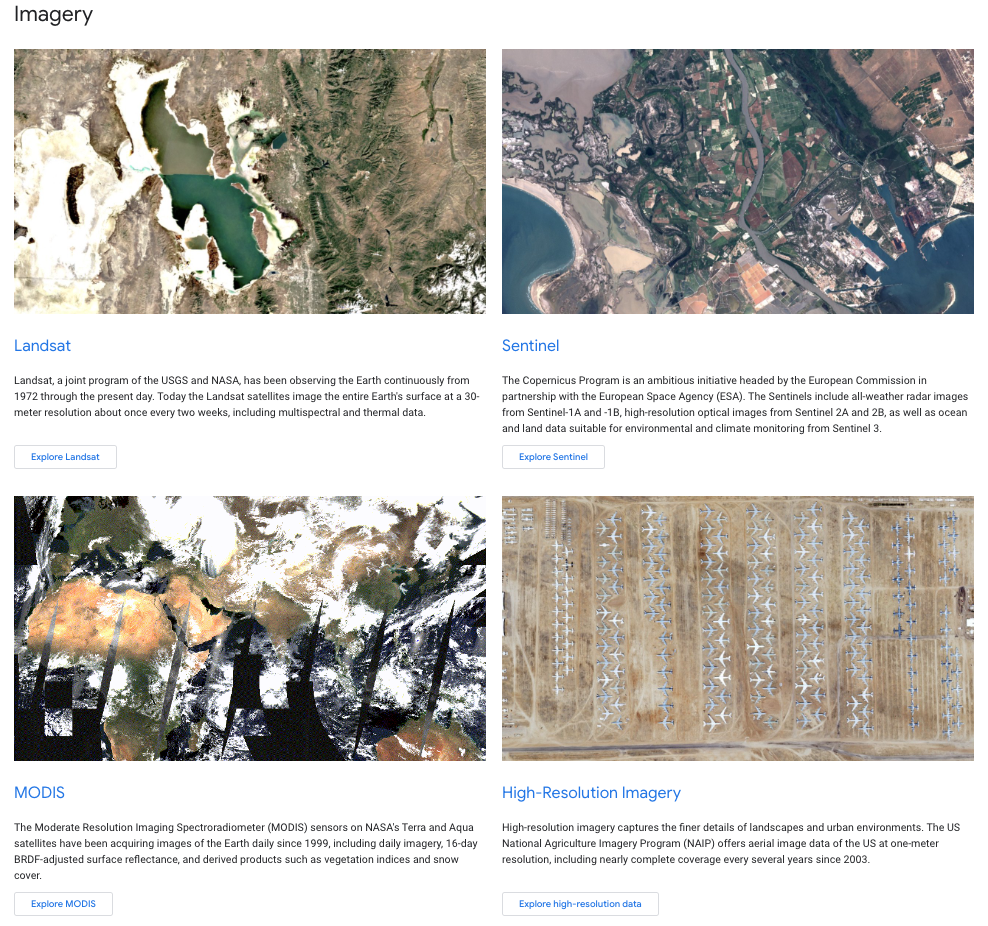
</div>

#### Precomputed data from previous analysis (manual or ML based)
  - Surface Temperature
  - Climate
  - Atmospheric
  - Weather
  - Elevation Data
  - Land Use / Land Cover (LULC)
  - More...

<div style="display: flex; justify-content: space-around; align-items: center;">
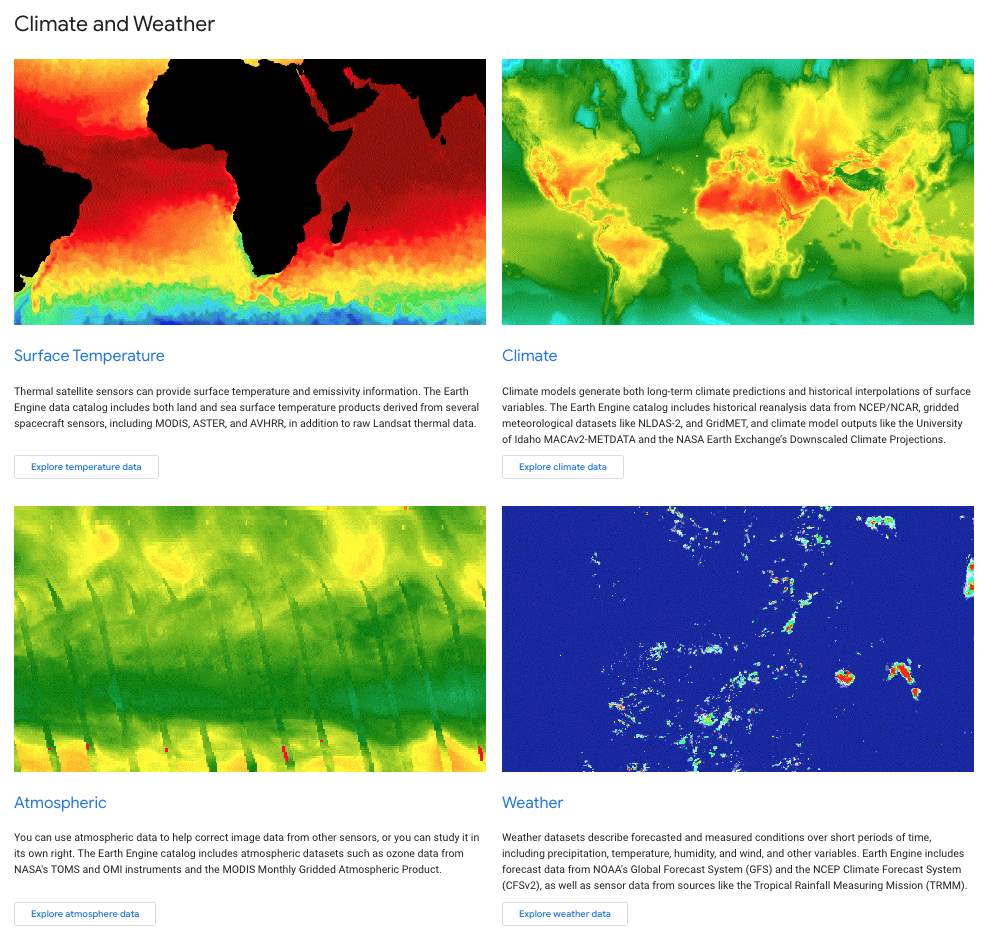
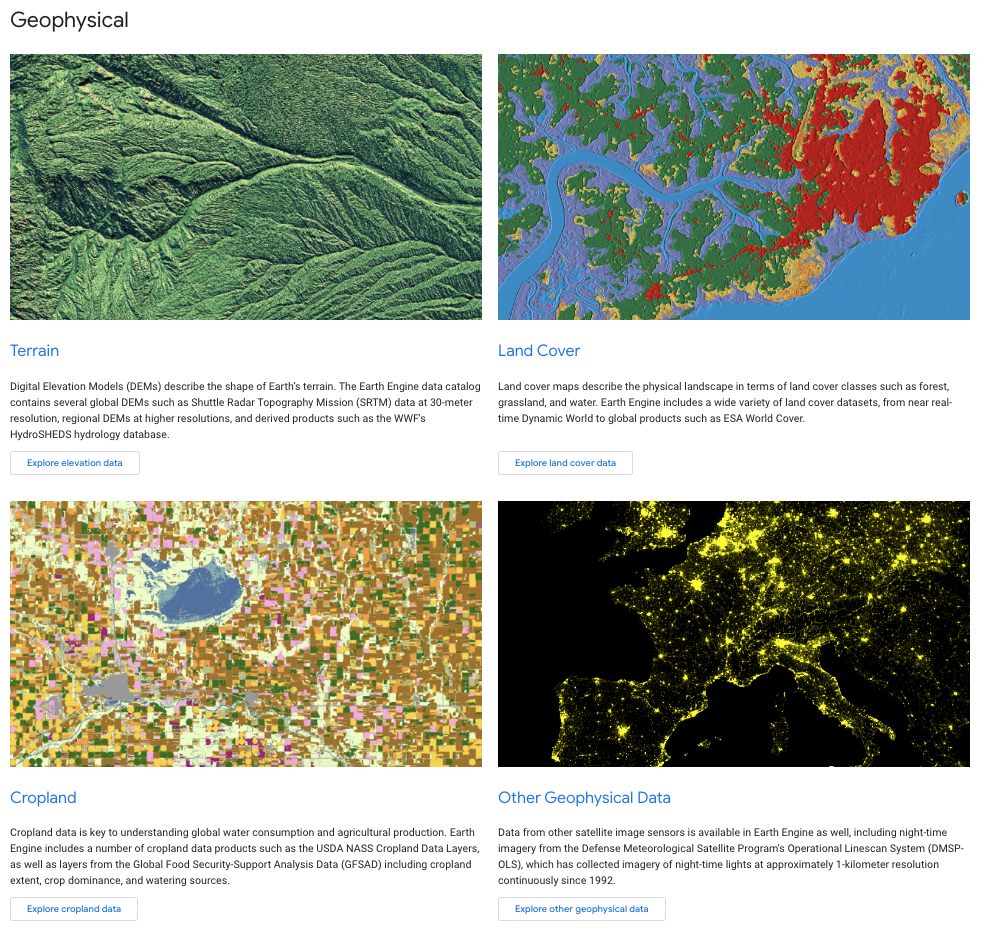
</div>

#### Area of interest (shape)
  - geopolitical border (country / state / city)
  - crop boundaries (precomputed or derived)
  - forest boundaries (precomputed or derived)

#### Uploaded Assets (images, shapes, tabular data)
  - via the [Google Earth Engine web interface](https://code.earthengine.google.com).
  

<div style="display: flex; justify-content: space-around; align-items: center;">
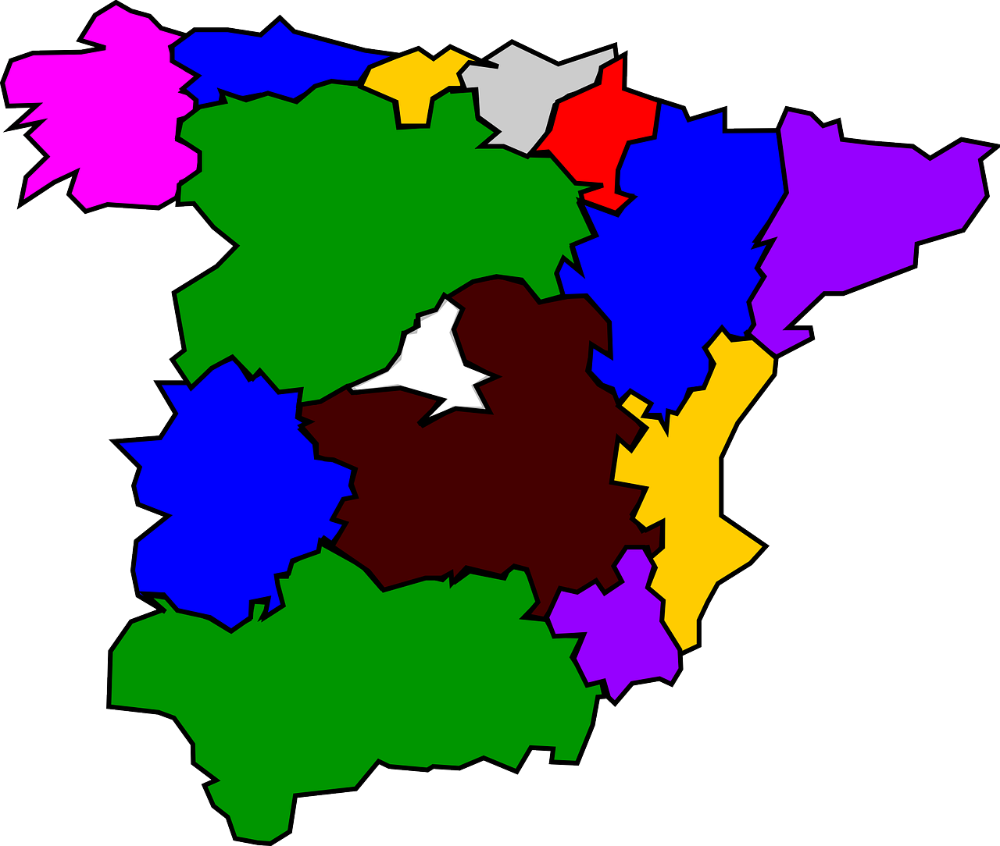
</div>

### 2. Preprocess input data
- Filter images by geographical bounds and time range
- Clip images by shape (different than filtering).
- Cloud removal
- Calculate spectral indices (research based measures for various ecological phenomena)
    - Technically part of processing, but many spectral indices are so common they are often used as input features for additional analysis
    - There are ready made libraries to calculate them: https://github.com/awesome-spectral-indices/spectral
- Calculate derived shapes if relevant

In [10]:
def get_s2_sr_cld_col(aoi, start_date, end_date):
    # Import and filter S2 SR.
    s2_sr_col = (ee.ImageCollection('COPERNICUS/S2_SR')
        .filterBounds(aoi)
        .filterDate(start_date, end_date)
        .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_FILTER)))

    # Import and filter s2cloudless.
    s2_cloudless_col = (ee.ImageCollection('COPERNICUS/S2_CLOUD_PROBABILITY')
        .filterBounds(aoi)
        .filterDate(start_date, end_date))

    # Join the filtered s2cloudless collection to the SR collection by the 'system:index' property.
    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))


AOI = ee.Geometry.Point([-75.92, 2.86]).buffer(100)
START_DATE = '2020-01-01'
END_DATE = '2021-01-01'

s2_sr_cld_col_eval = get_s2_sr_cld_col(AOI, START_DATE, END_DATE)

def display_cloud_layers(col):
    # Mosaic the image collection.
    img = col.mosaic()

    # Subset layers and prepare them for display.
    clouds = img.select('clouds').selfMask()
    shadows = img.select('shadows').selfMask()
    dark_pixels = img.select('dark_pixels').selfMask()
    probability = img.select('probability')
    cloudmask = img.select('cloudmask').selfMask()
    cloud_transform = img.select('cloud_transform')

    # Create a map object.
    Map = geemap.Map()
    Map.centerObject(AOI, 12)

    # Add layers to the folium map.
    Map.add_layer(img,
                   {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 2500, 'gamma': 1.1},
                   'S2 image', True, 1, 9)
    Map.add_layer(probability,
                   {'min': 0, 'max': 100},
                   'probability (cloud)', False, 1, 9)
    Map.add_layer(clouds,
                   {'palette': 'e056fd'},
                   'clouds', False, 1, 9)
    Map.add_layer(cloud_transform,
                   {'min': 0, 'max': 1, 'palette': ['white', 'black']},
                   'cloud_transform', False, 1, 9)
    Map.add_layer(dark_pixels,
                   {'palette': 'orange'},
                   'dark_pixels', False, 1, 9)
    Map.add_layer(shadows, {'palette': 'yellow'},
                   'shadows', False, 1, 9)
    Map.add_layer(cloudmask, {'palette': 'orange'},
                   'cloudmask', True, 0.5, 9)

    # Display the map.
    Map

s2_sr_cld_col_eval_disp = s2_sr_cld_col_eval.map(add_cld_shdw_mask)

display_cloud_layers(s2_sr_cld_col_eval_disp)


NameError: name 'CLOUD_FILTER' is not defined

### 3. Processing on Google Cloud Cloud
Use Google Cloud via Google Earth Engine to run algorithms directly on large inputs (to save on data transfers and taking advantage of Google's Cloud).

- Provided Statistical / Machine learning models
- Timeseries analysis (i.e. [CCDC](https://developers.google.com/earth-engine/apidocs/ee-algorithms-temporalsegmentation-ccdc))
- Sampling the data (i.e. [by pixel](https://developers.google.com/earth-engine/apidocs/ee-image-sample))
- Reduction operations (i.e. [to value](https://developers.google.com/earth-engine/apidocs/ee-imagecollection-reduce)) 
- [Pixel based aggregations](https://developers.google.com/earth-engine/apidocs/ee-image-expression)
- Custom code running on a Google Cloud Platform (i.e. custom made Tensorflow models).

**Note - these operations are performed asynchronously on automatically assigned Google Cloud platforms. Their speed will depend on general usage and the size of the task. Some tasks might fail, requiring reducing the area of interest / amount of images analysed to complete**

### 4. Exporting data
Google Earth Engine provides library support to export the following:
- Tables - data in columns and rows, i.e. CSV data
- Images - 3D arrays of data (multiband images) with various data types and additional metadata - i.e. GeoTiff data
- Maps - a rectangular pyramid of map tiles for use with web map viewers (images at different zoom levels).

Data can be exported to
- Google Earth Engine as assets
- Google Drive as files
- Google Cloud Storage as files on "bucket" storage (storage with no predefined size limit and apis used for ease in streaming the data).

### Ending A: Display data on Google Earth Engine
In some cases, keeping our code and data on Google Earth Engine is enough, as the platform provides us with the ability to:
- generate interactive maps with embedded layers and data - displayed in notebooks or using the JavaScript API
- code apps running wholely on the Google Earth Engine plaform - only using the JavaScript API (i.e. [CCDC Tools](https://parevalo_bu.users.earthengine.app/view/visualize-ccdc), [Dynamic World](https://dynamicworld.app/explore))

#### Advantages:
- Less code to handle
- Google provided basemap
- No additional costs for hosting / map access

#### Disadvantages:
- Vendor lock-in
- Limited access to data outside the platform (mainly by uploading to GCS / Google Earth Engine directly)
- Requires using Google Cloud and learning Google Earth Engine APIs to run custom code
- UI is limited to Google Earth Engine APIs
- Licensing limitations due to code running on Google Platform

### 5. Access Cloud Images

#### Access Locally
Copy images locally before processing (in case of a need for faster code access to the image, i.e. multiple reads of the whole image for analysis / usage in an ML model).
<div style="display: flex; justify-content: space-around; align-items: center;">
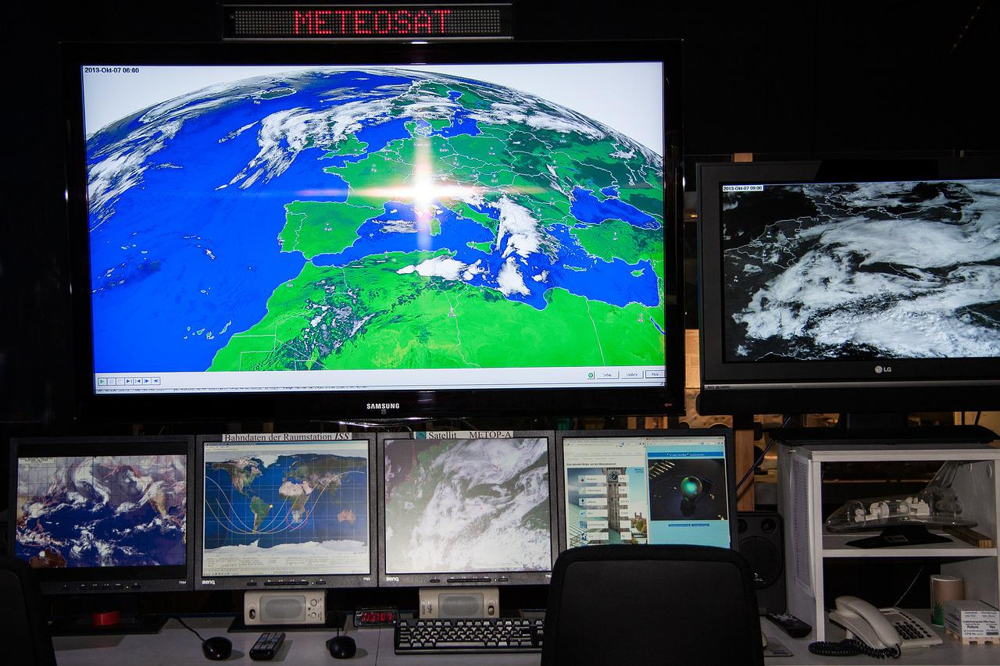
</div>

#### Access Remotely
Access images remotely via cloud (in case of less frequent read access / need for infrastructure flexibility, i.e a conversion pipeline or displaying the map - assuming data is saved in a "streamable" format - AKA [Cloud Optimized GeoTiffs](http://www.cogeo.org/)).

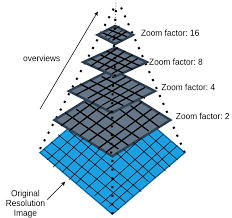
[Image Source - planet.com](https://developers.planet.com/docs/planetschool/an-introduction-to-cloud-optimized-geotiffs-cogs-part-1-overview/)

#### GDAL and Virtual File Systems
This flexibility in access is possible by using the Geospatial Data Abstraction Library - the de-facto standard for reading / writing raster data, and it's support for [virtual file systems](https://gdal.org/user/virtual_file_systems.html). It also supports reading archived data.
<div>
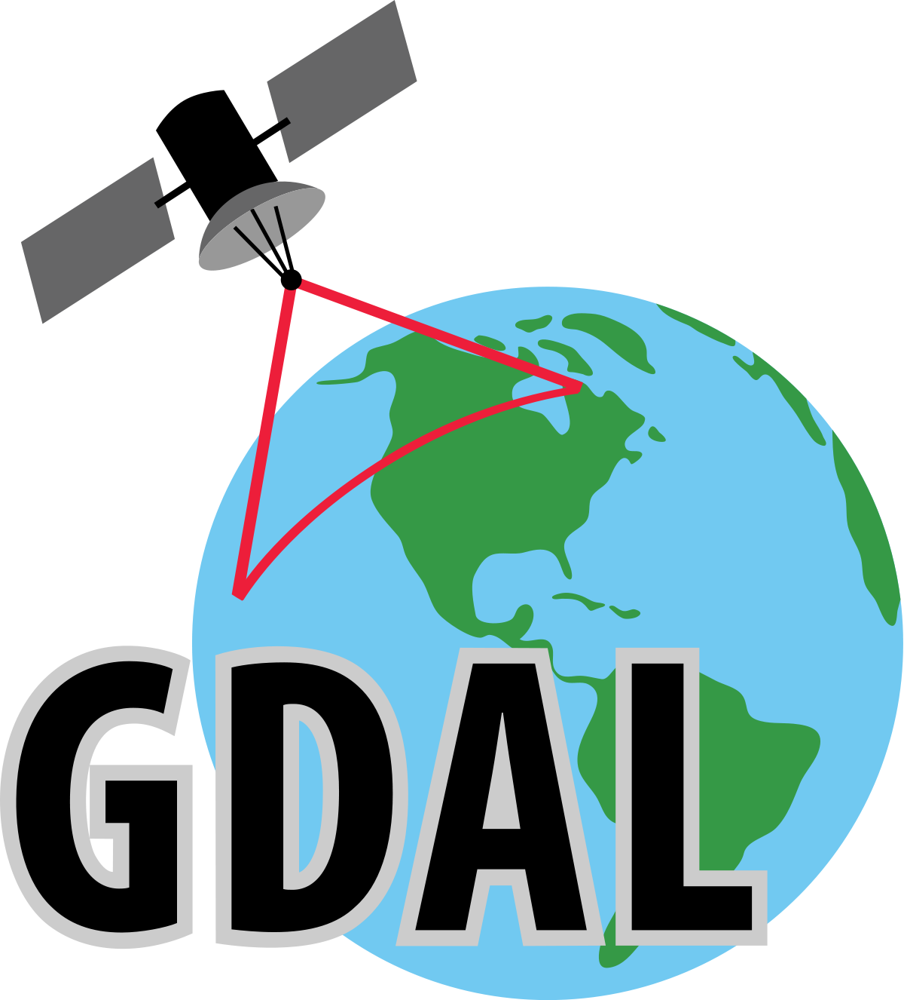
</div>

#### Windowed Reads
Either way, GeoTiff data is huge, and as a result - it is recommended (and possible) to read metadata separately from the image data, and access the image data in "windows" - rather than reading the whole image at once (similar to "[slicing](https://towardsdatascience.com/slicing-numpy-arrays-like-a-ninja-e4910670ceb0)" in numpy).
<div>
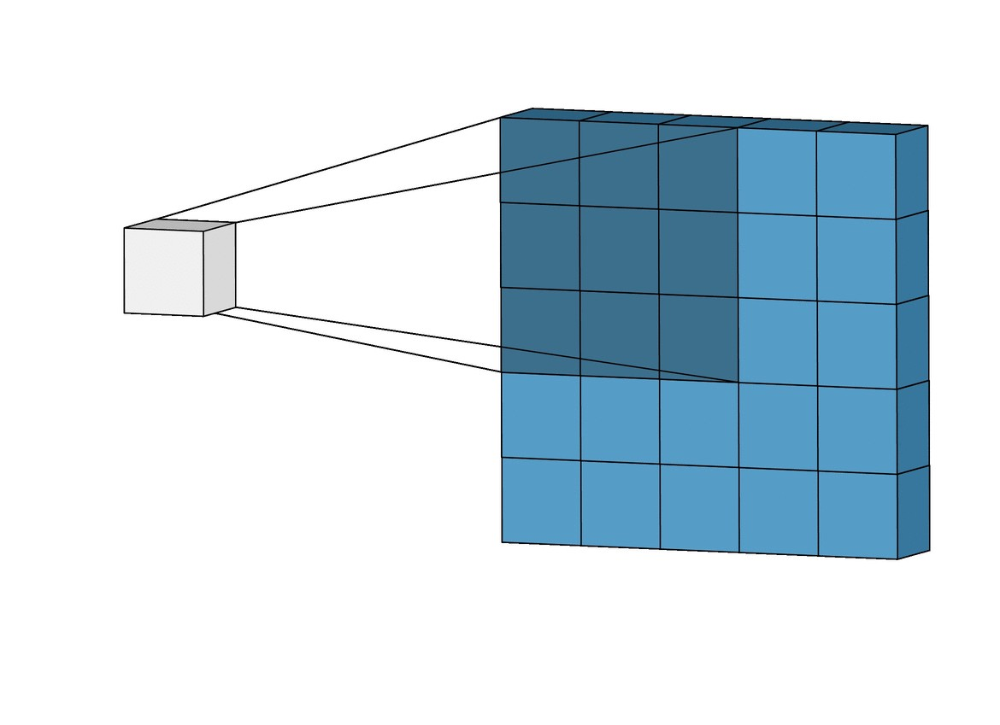
</div>
